<a href="https://colab.research.google.com/github/Ghada-Smida/Exploratory-Data-Analysis-Terrorism/blob/main/Terrorism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Exploratory Data Analysis - Terrorism**
1. To Perform 'Exploratory Data Analysis' on dataset "Global Terrorism"

2. Trying to figure out the Hot-Zone of Terrorism

In [ ]:
#import the important libraries
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import seaborn as sns
%matplotlib inline

In [ ]:
#import the dataset
df= pd.read_csv('/content/globalterrorismdb_0718dist.csv',encoding="latin1")
df.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.



,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [ ]:
df.shape

(181691, 135)

In [ ]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
#columns dataset
df.columns.values

array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [ ]:
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country',
                   'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                   'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                   'weaptype1_txt':'Weapon_type','motive':'Motive','city':'City'},inplace=True)
df['Victimes'] = df.Killed + df.Wounded
df=df[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType',
       'Killed','Wounded','Victimes','Target','Group','Target_type','Weapon_type']]
df.head()

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Victimes,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


In [ ]:
#check missing data
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             434
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Victimes       16874
Target           636
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [ ]:
#remove the missing data
df.dropna(axis=0, inplace=True)
df.shape

(159946, 16)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159946 entries, 0 to 181690
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         159946 non-null  int64  
 1   Month        159946 non-null  int64  
 2   Day          159946 non-null  int64  
 3   Country      159946 non-null  object 
 4   Region       159946 non-null  object 
 5   City         159946 non-null  object 
 6   latitude     159946 non-null  float64
 7   longitude    159946 non-null  float64
 8   AttackType   159946 non-null  object 
 9   Killed       159946 non-null  float64
 10  Wounded      159946 non-null  float64
 11  Victimes     159946 non-null  float64
 12  Target       159946 non-null  object 
 13  Group        159946 non-null  object 
 14  Target_type  159946 non-null  object 
 15  Weapon_type  159946 non-null  object 
dtypes: float64(5), int64(3), object(8)
memory usage: 20.7+ MB


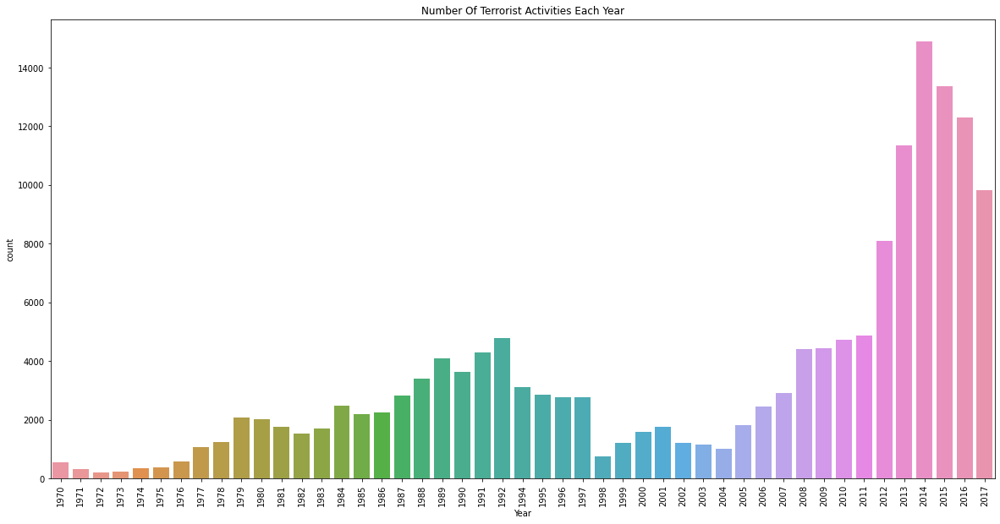

In [ ]:
#count terrorist attack each year

plt.figure(figsize=(20, 10))
sns.countplot(x="Year", data=df)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

# ***comment:***

we can see the highest attacks happens in 2014

In [ ]:
year_cas = df.groupby('Year').Victimes.sum().to_frame().reset_index()
year_cas.columns = ['Year','Victimes']
px.bar(data_frame=year_cas,x = 'Year',y = 'Victimes',color='Victimes')

# ***comment:***

It is observed that 2015 marks the highest Victimes records.

In [ ]:
target = list(df['Target_type'])
target_map = dict(Counter(target))
target_df = pd.DataFrame(target_map.items())
target_df.columns = ['Target Type','Count']
px.bar(data_frame=target_df,x = 'Target Type',y = 'Count',color='Target Type')

# ***comment:***

the Private Citizens & Property is the highrst amongst all target type.

In [ ]:
#analyze the type of attacks
#Counting the Victimes according the Attack Type
AttackType=df.pivot_table(columns='AttackType',values='Victimes',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

In [ ]:
#plotting the Attack Type
labels = AttackType.columns.tolist()
attack=AttackType.T
values=attack.values.tolist()
values = sum(values,[])
attack_type = list(df['AttackType'].unique())
fig = go.Figure(data=[go.Pie(labels = attack_type,values=values,hole=.3)])
fig.show()

# ***comment:***

**Armed assult andassasination methods shows the highest chossen type.** 

In [ ]:
from collections import Counter
values = list(df['AttackType'])
value_map = dict(Counter(values))
value_df = pd.DataFrame(value_map.items())
value_df.columns = ["AttackType","Count of Attack Type"]
px.bar(data_frame=value_df,x = 'AttackType',y = 'Count of Attack Type',color = 'AttackType')

# ***comment:***

Bombing and explosion show the highest

In [ ]:
#Top 10 Countries with the highest Terrorist Attack
plt.figure(figsize=(15,6))
country_attack=df.Country.value_counts()[:10].reset_index()
country_attack.columns= ["Country", "Total Attacks"]
px.bar(data_frame= country_attack,x = 'Country',y = 'Total Attacks',color = 'Country')

<Figure size 1080x432 with 0 Axes>

# ***comment:***

Iraq is the highest country with terrorist attack then Pakisatn and afghanistan

In [ ]:
plt.figure(figsize=(15, 8))
cas_count= df.groupby("Country").Victimes.sum().to_frame().reset_index().sort_values("Victimes", ascending=False)[:15]
px.bar(data_frame=cas_count,x = 'Country',y = 'Victimes',color='Country')

<Figure size 1080x576 with 0 Axes>

# ***comment:***

Iraq again is the highest country with the victims terrorist attack then Afghanistan

In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import folium
from folium.plugins import MarkerCluster
year=df[df['Year']==2014]
Datamap=year.loc[:,'City':'longitude']
Datamap=Datamap.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(Datamap)):
    folium.Marker(location=[Datamap[point][1],Datamap[point][2]],
                  popup = Datamap[point][0]).add_to(markerCluster)
map

# ***comment:***

The middle-east region show the highest Terrorist attack